# Leture12. Visualizing and Understanding

CNN의 내부는 어떻게 생겼을까? 네트워크의 중간과정을 확인할 방법은 없을까?  
가장 만만하게 접근해 볼 수 있는 게 **first layer**를 시각화하는 방법!  
## 1. Visualize First layer  

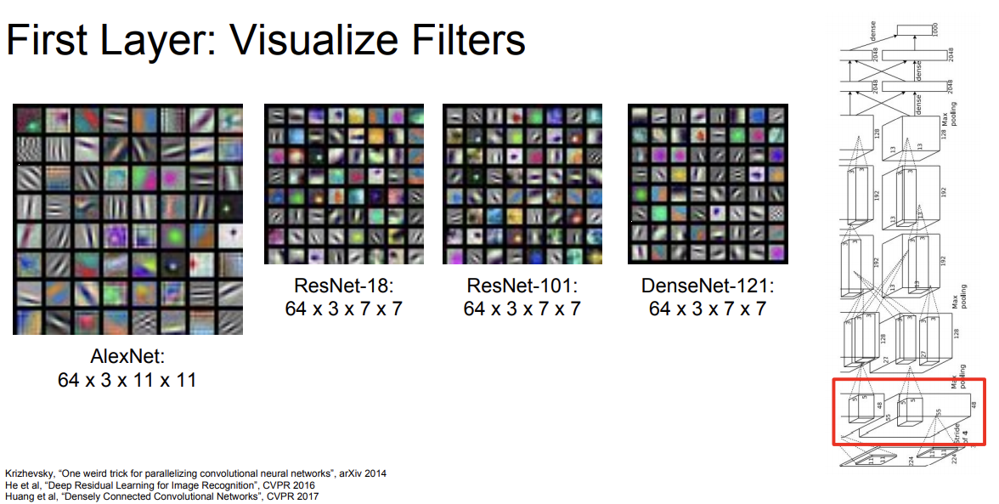

conv layer의 학습된 가중치들을 시각화해서 필터들이 무엇을 찾는지 알 수 있다. 엣지 성분과 다양한 각도와 위치에서의 보색이 나타난다. conv filter와 이미지의 일부영역과 내적한 결과가 첫번째 layer의 출력이다.  
중간 레이어들도 시각화할 수 있긴 하지만, 필터들이 이미지와 직접 연결되어 있지 않기 때문에 가중치들을 시각화한다 해도 이를 해석하는 것은 쉽지 않다.  

## 2. Visualize Last layer  
### 1) Nearest Neighbors
마지막 hidden layer를 시각화하는 방법은 nearest neighbors를 이용한 방법이다. CNN(AlexNet)에서 나온 4096 차원의 feature vector에서 nearest neighbors를 계산한 결과는 다음 그림과 같다.  

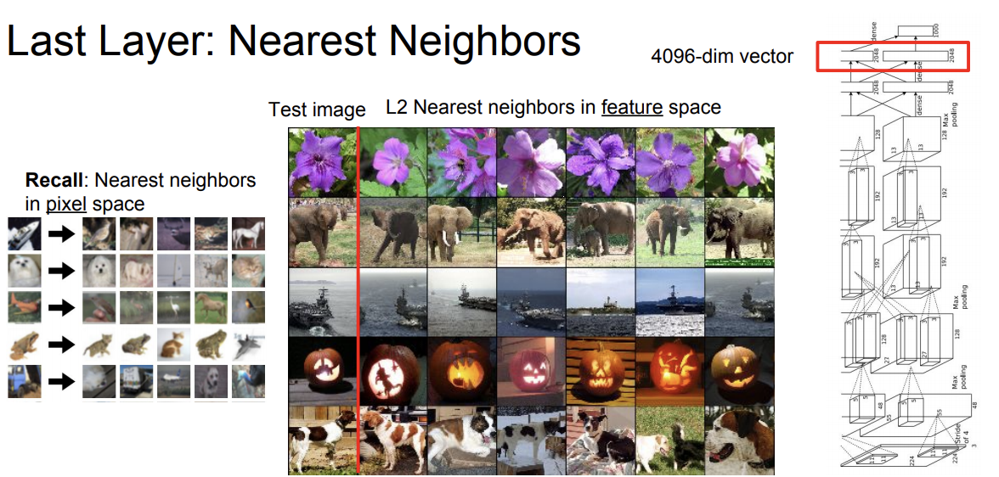

### 2) 차원 축소 Dimensionality Reduction (PCA)  
최종 레이어에서 어떤 일어나는지를 시각화하는 것을 '차원 축소'의 관점으로 볼 수도 있다. 

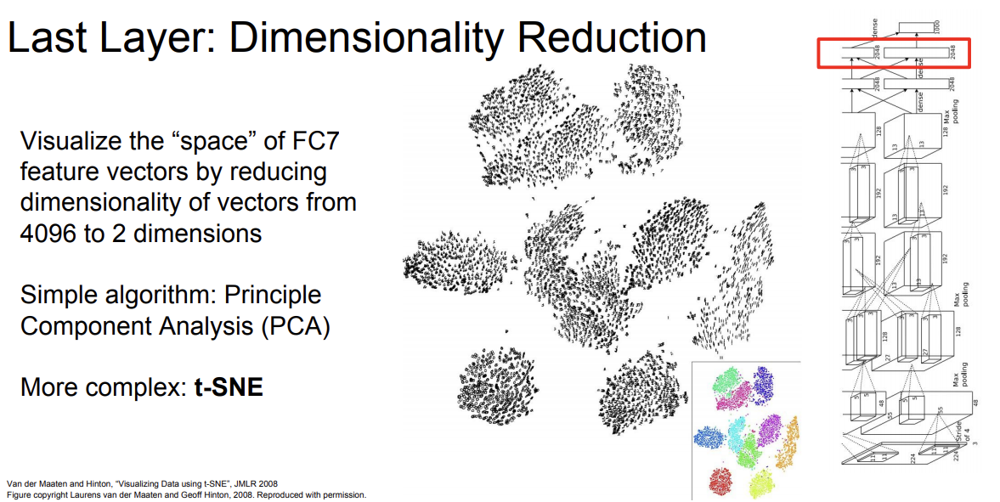

차원 축소를 위한 간단한 알고리즘으로 **PCA(Principle Component Analysis)** 가 있다. 4096차원과 같은 고차원의 특징 벡터들을 2차원으로 압축시키는 기법이다. PCA 기법을 통해 특징 공간을 더 직접적으로 시각화시킬 수 있다.  
PCA보다 더 강력한 알고리즘으로 **t-SNE 알고리즘** 이 있다. 위 그림에서 t-distributed Stochastic Neighbor Embeddings 알고리즘으로 28x28차원의 이미지를 입력으로 받아서 2차원으로 압축하여 다음과 같이 회색조로 시각화할 수 있다.  

## 3. Visualizing Activations  
AlexNet의 conv5 layer는 3차원의 값(width x height x depth)을 반환한다. 이 3차원의 덩어리가 바로 네트워크의 레이어가 출력하는 값이고, 이를 **'activation volume'** 이라고 한다. 이 덩어리를 하나씩 잘라낸 것을 **activation map** 이라고 한다.  
### 1) Maximally Activating Patches  
어떤 이미지가 들어와야 각 뉴런들의 활성이 최대화되는지 시각화하는 방법이다. 

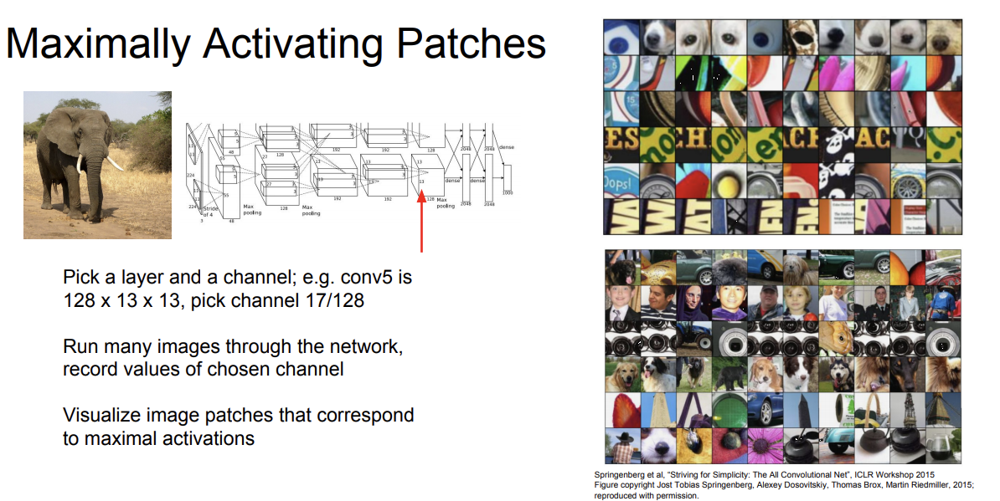

AlexNet의 conv5 layer를 선택했고, 128개의 채널 중에 17번째 채널을 선택했다. 어떤 이미지가 17번째 activation map을 최대로 활성화 시키는지를 시각화한 결과이다. 각각의 그림은 해당 레이어의 활성을 최대화시키는 패치들을 나타낸 것이다.  
  
### 2) Occlusion Experiments  

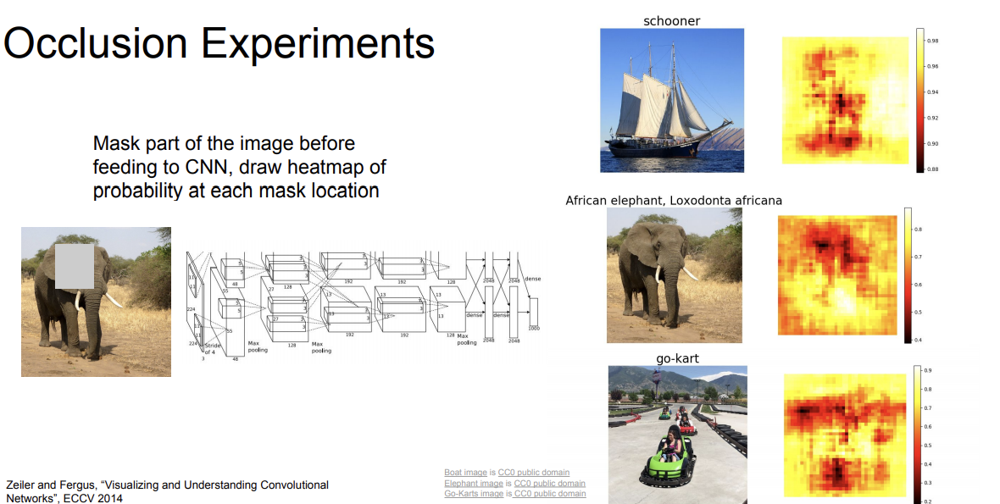

입력의 어떤 부분이 분류를 결정짓은 근거가 되는지에 대한 실험이다.  
먼저 입력 이미지의 일부를 가림패치(occlusion patch)로 가린다. 가린 부분은 데이터의 평균값으로 채운다. 이 이미지를 네트워크에 통과시키고, 네트워크가 이미지를 예측한 확률을 기록한다. 가림패치를 전체 이미지에 대해 돌아가면서(slide) 같은 과정을 반복한다.  
  
✔️이 실험의 아이디어는 만약 이미지의 일부를 가렸는데, 네트워크 score의 변화가 크게 발생한다면 가려진 부분이 분류를 결정짓는 중요한 부분이었을 것! ~> 이런 시각화는 네트워크의 성능을 높이는 것이 아닌 개발자의 이해가 목적!

###  3) Saliency Maps  

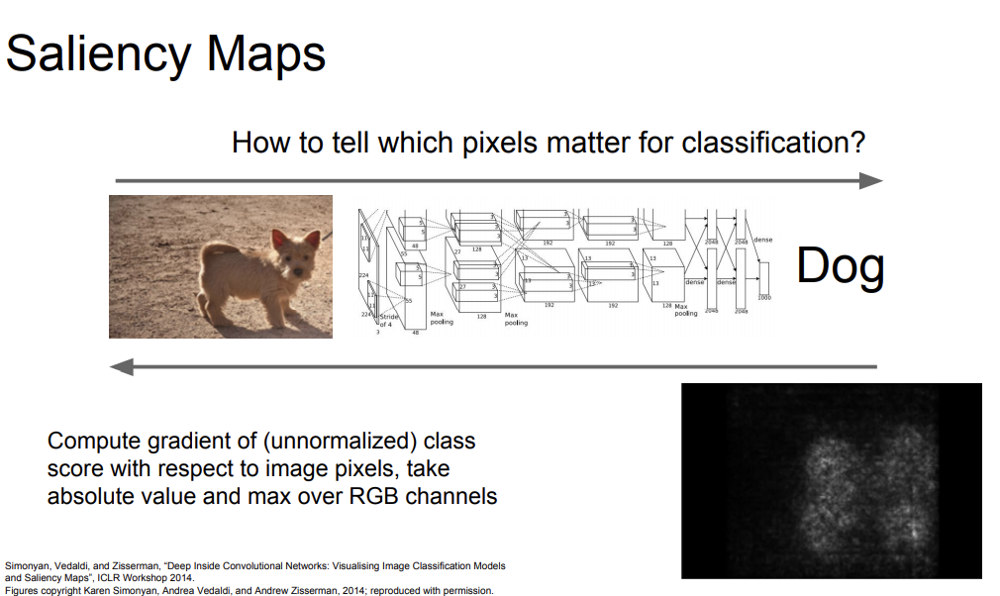

입력 이미지의 각 픽셀들에 대해서 예측한 클래스 스코어의 그래디언트를 계산하는 방법이다. '1차 근사적 방법'으로 어떤 픽셀이 영향력 있는지를 알려준다. 

### 4) Intermediate Features via Guided backprop  

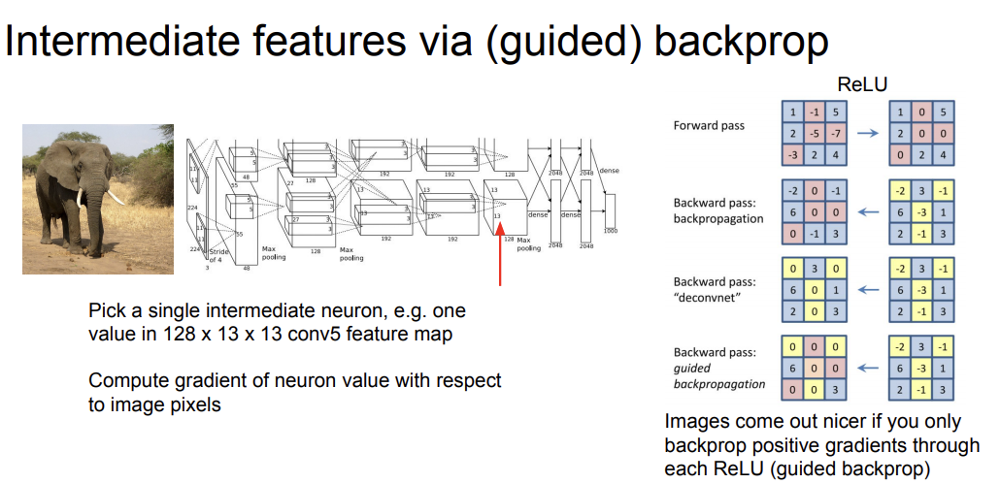

backprop시 전체 네트워크가 '양의 부호인 gradient'만을 고려하는 방법이다.  
네트워크의 중간 뉴런을 하나 고르고, 입력 이미지의 각 픽셀에 대한 네트워크 중간 뉴런의 그래디언트를 계산한다. guided backprop시 ReLU를 통과할 때 ReLU의 gradient의 부호가 양수이면 그대로 통과시키고, 부호가 음수이면 backprop하지 않는다. 훨씬 더 선명하고 좋은 이미지를 얻을 수 있다. 

## 4. Visualizing CNN features: Gradient Ascent  

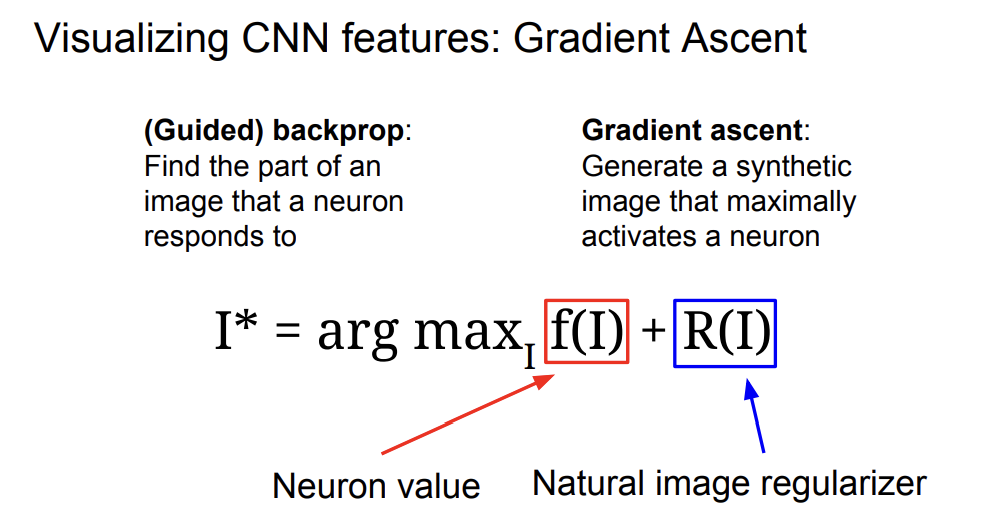

입력 이미지에 의존하지 않고 cnn feature를 시각화하는 방법이다. 네트워크의 weight는 고정시키고, 특정 뉴런을 활성화시키는 '일반적인' 입력 이미지를 찾아내는 방법이다.  
함수 식에 regularization term도 추가되었는데, 생성되는 이미지가 특정 네트워크의 특성에 오버피팅되는 것을 방지하기 위함이다. regularization term을 추가함으로써  
* 1) 생성된 이미지가 특정 뉴런의 값을 최대화시키는 방향으로 생성되도록 하고,  
* 2) 생성된 이미지가 자연 상태에서 잘 볼 수 있도록  
  
되길 원한다. 결국, 생성된 이미지가 비교적 자연스럽도록 강제하는 역할을 한다. 여기서 I* 가 이미지의 픽셀 값을 나타낸다.  

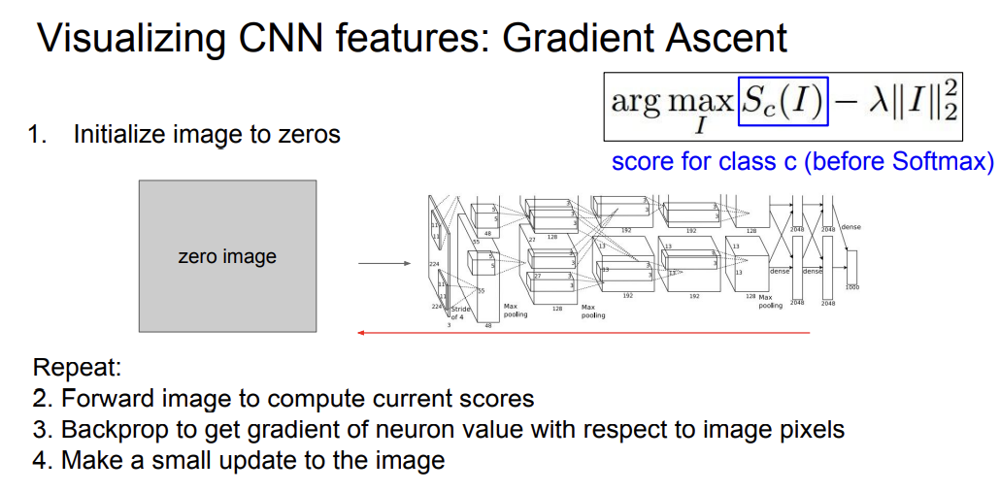

일반적인 이미지를 만들어내는 방법은 다음과 같다.
1. gradient ascent를 위한 초기 이미지들을 zeros, uniform, noise등으로 초기화시켜준다.  
2. 초기화를 하고 나면 이미지를 네트워크에 통과시켜서 스코어 값을 계산한다.  
3. 이미지의 각 픽셀에 대한 해당 뉴런의 스코어의 gradient를 계산하여 backprop을 수행한다.  
4. gradient ascent를 이용해서 이미지 픽셀 자체를 업데이트 한다. (해당 스코어를 최대화시키려 함)  
그리고 생성된 이미지에 대해 L2 norm을 계산해서 더해준다.  

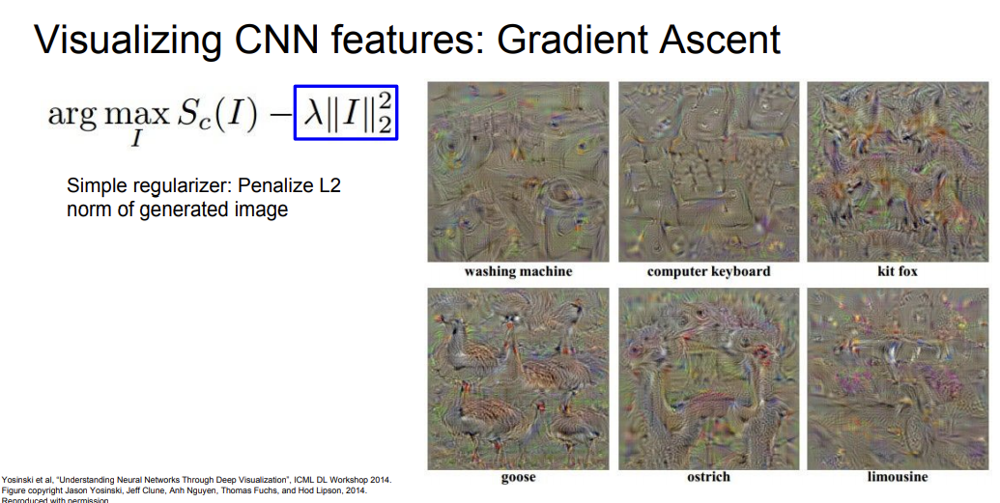

## 5. Deep Dream  
DeepDream의 목적은 '재미있는 이미지를 만드는 것'이다.  

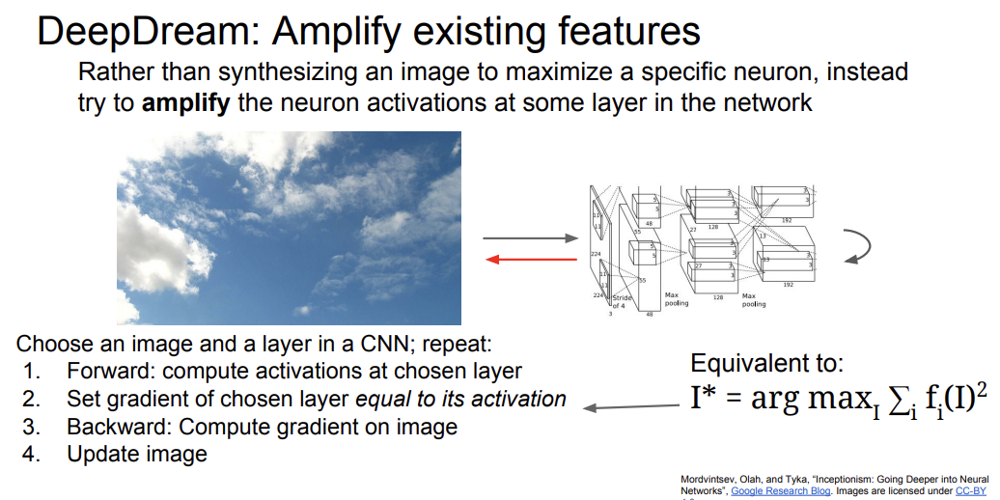

1. 입력 이미지를 cnn의 중간 레이어를 통과시키고,  
2. backprop을 할 때 해당 레이어의 그래디언트를 activation 값으로 설정한다.  
3. backprop을 해서 이미지를 업데이트하는 과정을 계속 반복한다. 
  
이를 네트워크가 해당 이미지에서 뽑아낸 특징들을 증폭시키려는 것으로 해석할 수 있다. 그리고 이는 해당 레이어에서 나온 특징들의 L2 norm을 최대화시키는 것으로도 볼 수 있다. 위의 구름 이미지에 대해 다음과 같은 결과를 얻을 수 있다.  

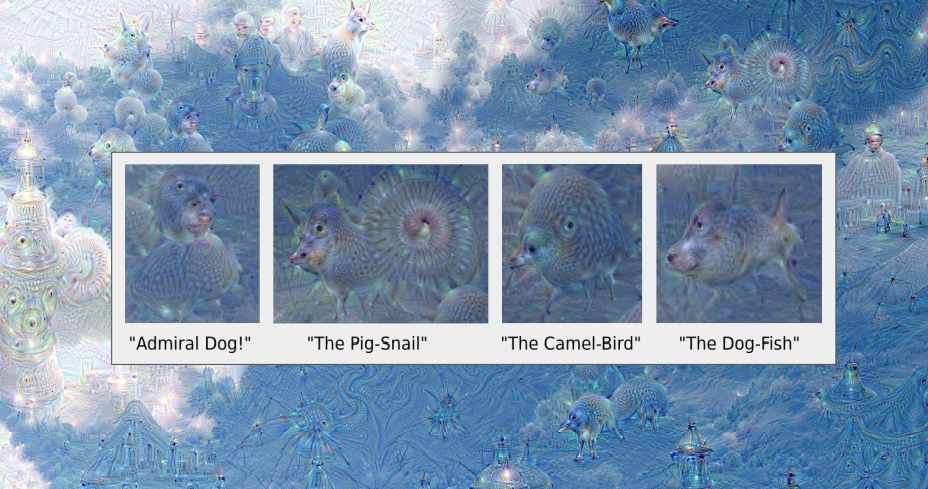

## 6. Feature Inversion  
이 방법은 네트워크의 다양한 Layer에서 어떤 요소들을 포착하고 있는지 짐작할 수 있는 방법이다. 

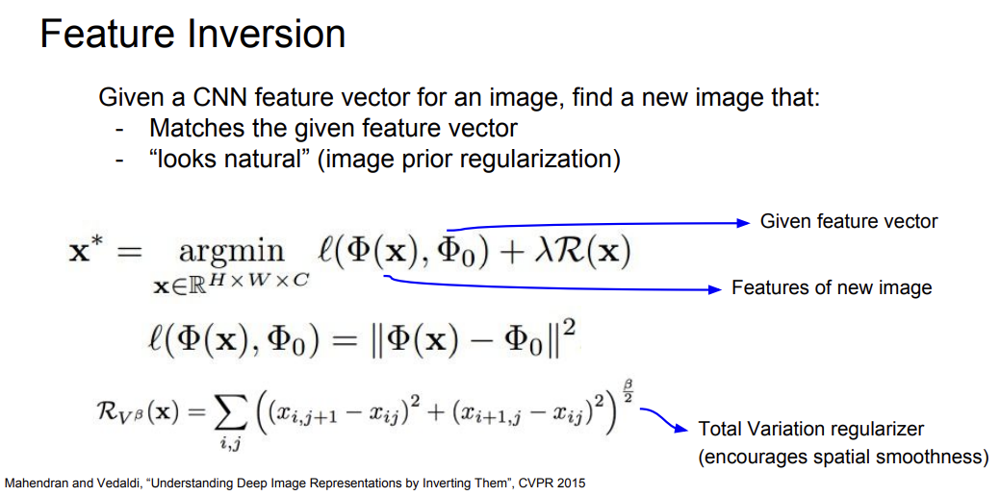

방법은 다음과 같다. 어떤 이미지를 네트워크에 통과시키고, 네트워크를 통과시켜 얻은 activation map을 저장해둔다. 그리고 이 activation map만 가지고 이미지를 재구성한다.  
이 방법에서 regularizer를 추가한 gradient ascent를 이용한다. 스코어를 최대화하는 방법 대신 특징 벡터의 거리가 최소화하는 방향으로 update를 시킨다. 여기서 **total variation regularizer** 은 상하좌우 인접 픽셀 간의 차이에 대한 패널티를 부여하여 생성된 이미지가 자연스러운 이미지가 되도록 해준다. 

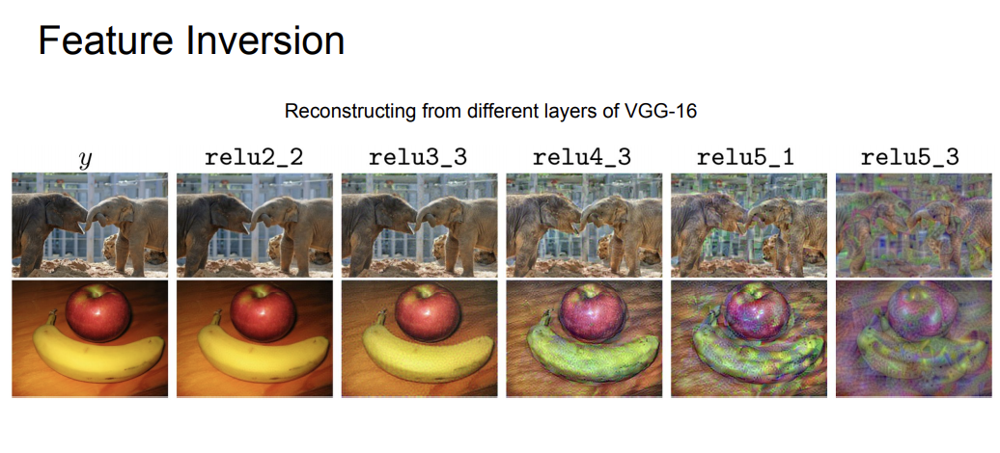

## + Texture Synthesis  
텍스처 합성은 구조적 컨텐츠를 활용하여 작은 디지털 샘플 이미지에서 큰 디지털 이미지를 알고리즘적으로 구성하는 과정이다.  
#### 1) nearest neighbor를 통한 텍스처 합성 방법(고전적인 방법)  
신경망 대신에 scan line을 따라서 한 픽셀씩 이미지를 생성해 나가는 방식이다.  
#### 2) neural texture synthesis  
Neural texture synthesis 를 구현하기 위해서 Gram matrix라는 개념을 이용한다.  
**Gram Matrix** 란 서로 다른 공간 정보에 있는 Channel들을 가지고 외적을 계산하여 새로운 Matrix를 만드는 것을 말한다. 이 Matrix는 특징 벡터간 다양한 상관 관계를 한 번에 나타낼 수 있도록 만들어졌다.

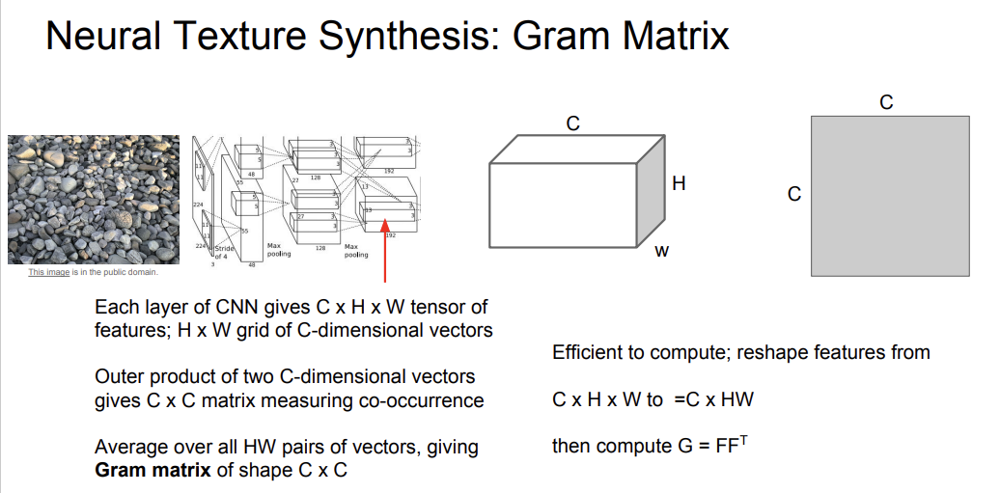

과정은 Gradient Ascent 과정과 비슷하다. 좀 더 깊은 레이어에서 생성한 gram matrix를 이용해야 텍스처 합성에 잘 활용할 수 있다!

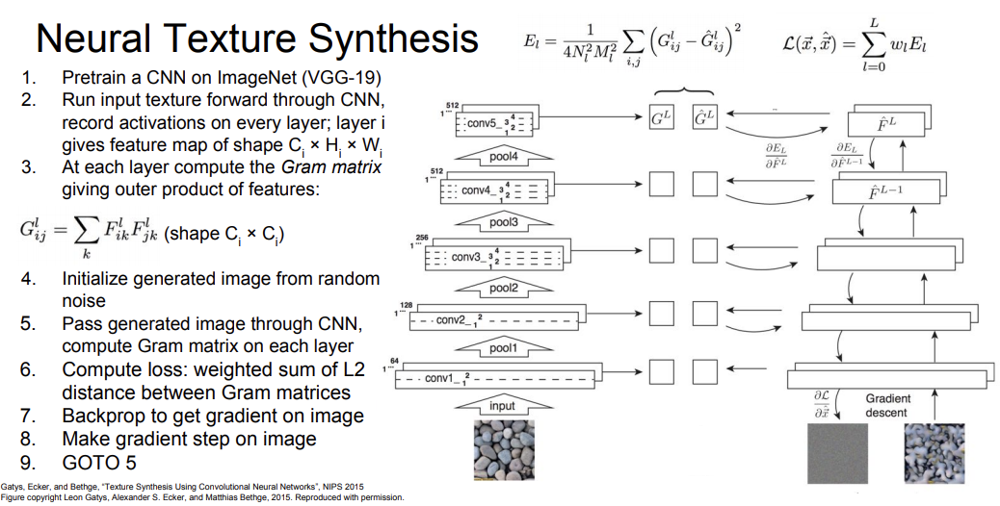

## 7. Neural Style Transfer  
텍스처 합성을 예술에 적용한 개념이 바로 Neural style transfer이다. Gram Matrix를 재구성하는 것과 Feature를 재구성 하는 것을 합하여 만들어진 이미지 결과가 Neural Style Transfer이다.  

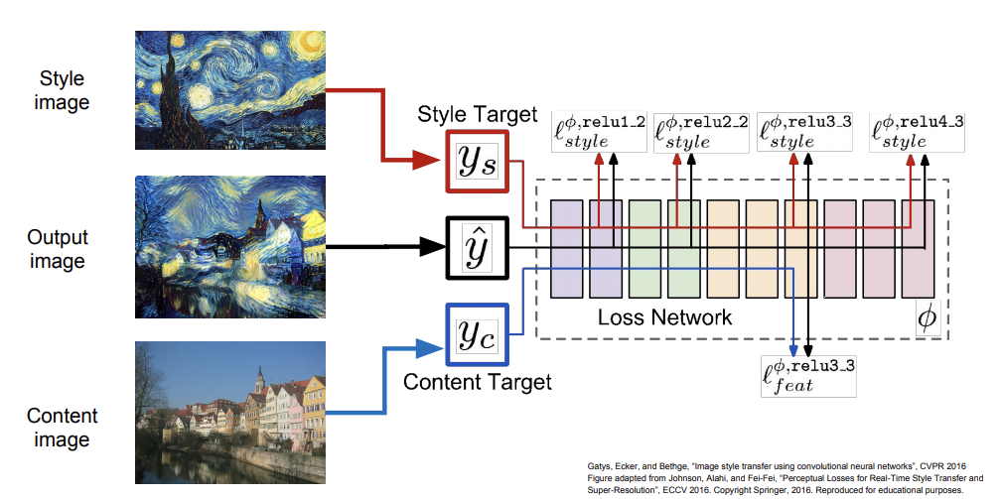

Neural Style Transfer에서는 입력이 두 가지이다.  
* 첫 번째 Content Image는 우리의 최종 이미지가 어떻게 생겼으면 좋겠는지 알려주는 이미지이고,  
* 두 번째 Style Image는 최종 이미지의 Texture가 어떻게 생겼으면 좋겠는지 알려주는 이미지이다.  
최종 이미지는 Content Image의 Feature Reconstruction Loss도 최소화하고, Style Image의 Gram Matrix Reconstruction Loss도 최소화하도록 만들어진 이미지이다.  
  
하지만 Neural Style Transfer는 수많은 forward, backward 과정을 반복해야 하므로 굉장히 느리다는 단점이 있다. 따라서 Style Transfer를 위해 네트워크를 학습시키는 또 다른 방법이 있다.

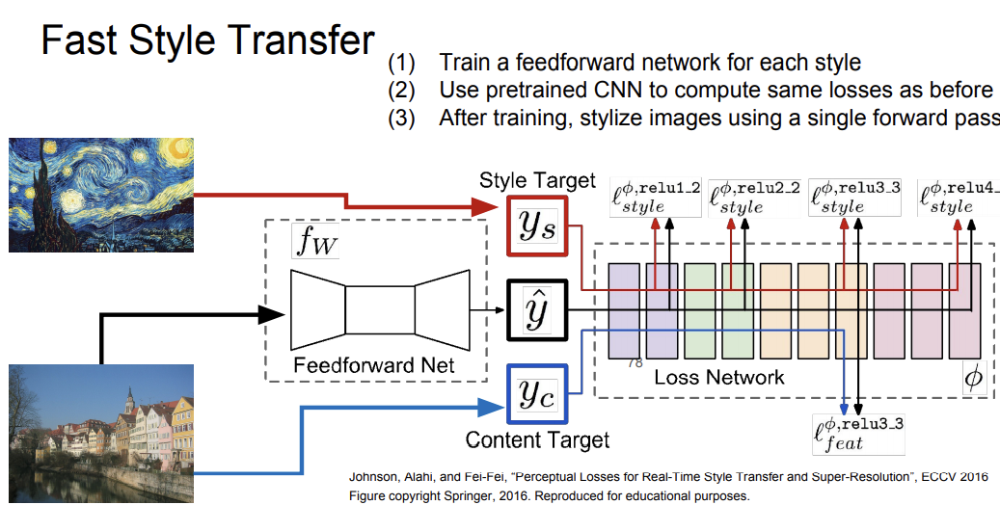

### Fast Style Transfer  
합성하고자 하는 이미지의 최적화를 전부 수행하는 것이 아니라 Content Image만을 입력으로 받아서 단일 네트워크를 학습시키는 방법이다.
  
이 네트워크 학습시에는 content loss와 style loss를 동시에 학습시키고 네트워크의 가중치를 업데이트를 시킨다. 학습은 좀 오래걸리지만 한 번 학습을 시키고 나면 이미지를 네트워크에 통과시키면 결과를 바로 볼 수 있다.  
  
앞서 본 Style Transfer의 단점은 네트워크 하나당 하나의 Style Transfer만을 만들 수 밖에 없다는 점이다. 이에 구글에서 Content Image와 Style Image를 동시에 넣는 방식으로 다양한 스타일을 만들어 내는 논문을 제안했다.

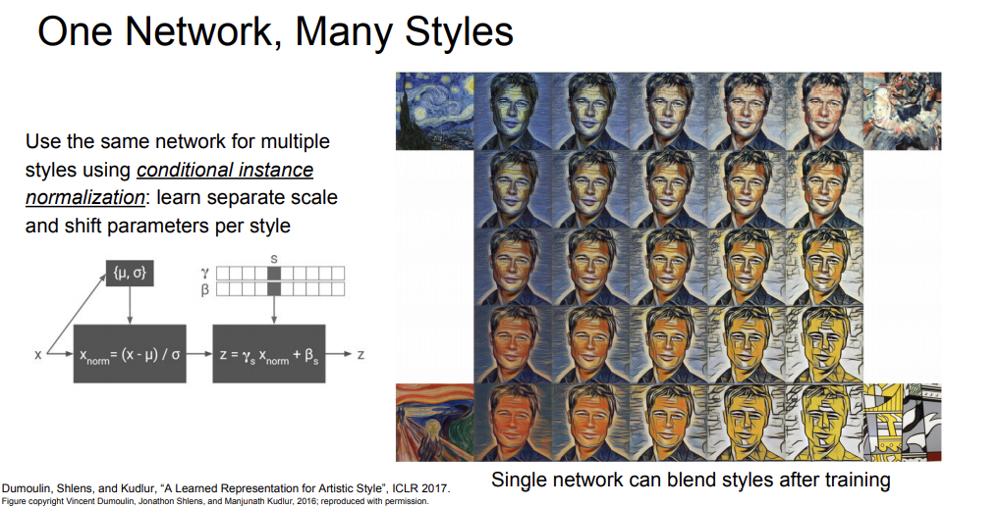